# Сверточная нейронная сеть

---

В этом задании вы научитесь работать с изображениями, а также построите сверточную нейронную сеть и сравните ее с полносвязной сетью из предыдущего домашнего задания.




In [ ]:
from torch import nn
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR10
from torch.utils.data import DataLoader
from torchvision.utils import make_grid

import numpy as np
import matplotlib.pyplot as plt

from tqdm.auto import trange

# Задание 1: Работа с изображениями (1 балл)

Загрузите изображение `lena.png` в переменную `lena`. Отобразите результат на экран. Убедитесь, что `opencv` открывает изображение в формате `BGR`.

In [ ]:
!wget -O lena.png https://raw.githubusercontent.com/opencv/opencv_extra/master/testdata/viz/lena.png

--2025-02-23 15:07:16--  https://raw.githubusercontent.com/opencv/opencv_extra/master/testdata/viz/lena.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 488594 (477K) [image/png]
Saving to: ‘lena.png’

lena.png            100%[===================>] 477.14K  --.-KB/s    in 0.05s   

2025-02-23 15:07:16 (9.91 MB/s) - ‘lena.png’ saved [488594/488594]



In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow

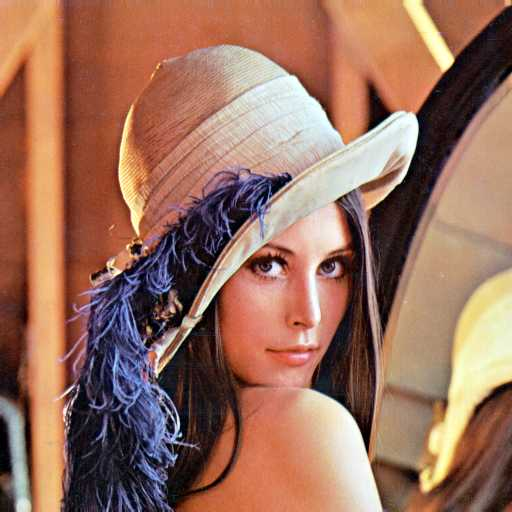

In [ ]:
lena = cv.imread("/content/lena.png")

cv2_imshow(lena)

Структура данных изображения:

In [ ]:
lena.shape

(512, 512, 3)

Разделим на каналы и посмотрим на каждый:

In [ ]:
blue_channel, green_channel, red_channel = cv.split(lena)

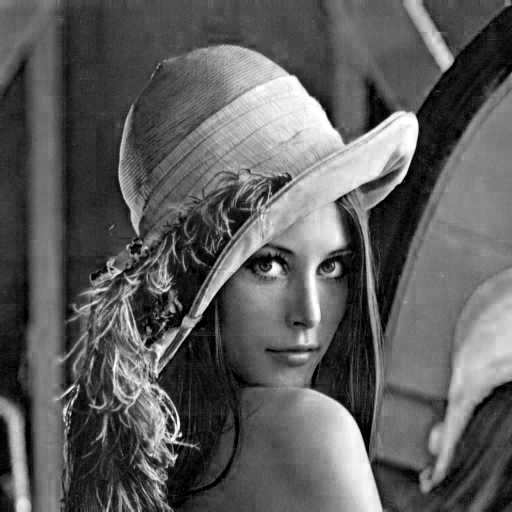

In [ ]:
cv2_imshow(blue_channel)

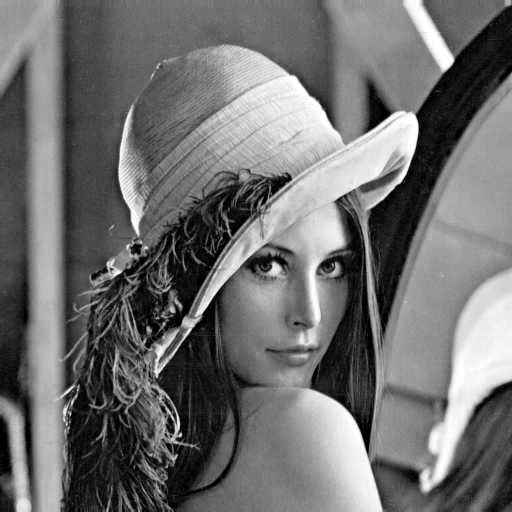

In [ ]:
cv2_imshow(green_channel)

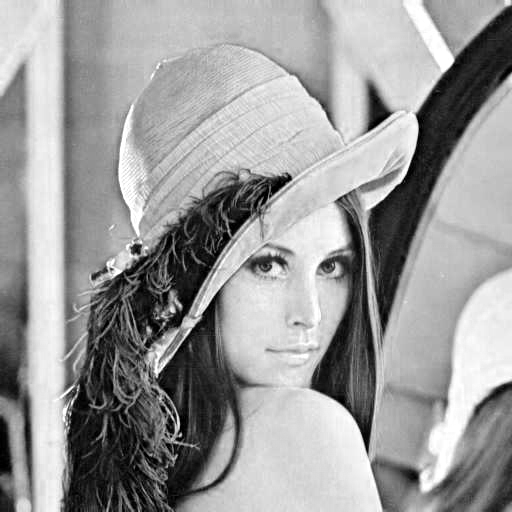

In [ ]:
cv2_imshow(red_channel)

Каждый канал это матрица 512 на 512, где каждое число принимамет значение от 0 до 255, показывая интенсивность цвета соответсвующего канала

## 1.1 Перевод в RGB

Переведите изображение `lena` в RGB несколькими способами:

*   c помощью функций split & merge;
*   с помощью индексации в numpy;
*   с помощью cvtColor.


Перевод изображения в RGB с помощью функий split и merge

opencv открывает изображения в формате BGR, поэтому если после перевода изображения в RGB открыть его с помощью opencv, то изображение получится с искаженными цветами:

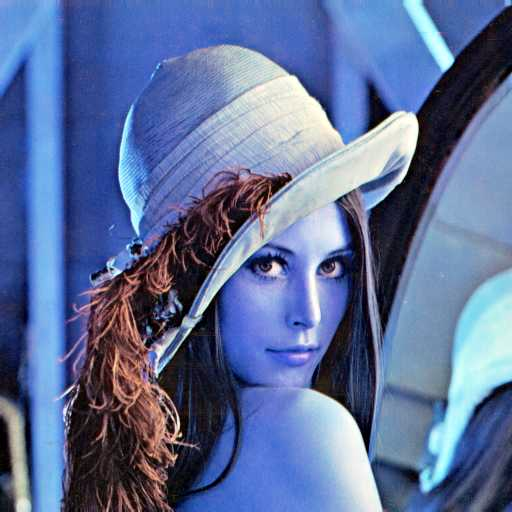

In [ ]:
blue_channel, green_channel, red_channel = cv.split(lena)

merged_rgb_lena = cv.merge([red_channel, green_channel, blue_channel])
cv2_imshow(merged_rgb_lena)

Откроем картинку с помощью matplotlib:

(-0.5, 511.5, 511.5, -0.5)

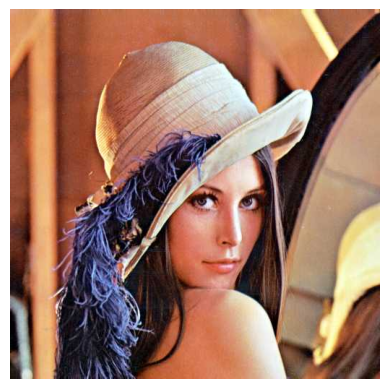

In [ ]:
plt.imshow(merged_rgb_lena)
plt.axis("off")

Перевод изображения в RGB с помощью cvtColor:

(-0.5, 511.5, 511.5, -0.5)

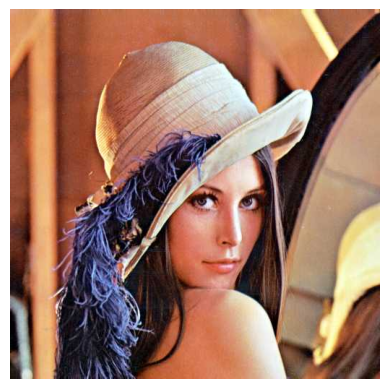

In [ ]:
rgb_lena = cv.cvtColor(lena, cv.COLOR_BGR2RGB)
plt.imshow(rgb_lena)
plt.axis("off")

Перевод изображения в RGB с помощью numpy:

(-0.5, 511.5, 511.5, -0.5)

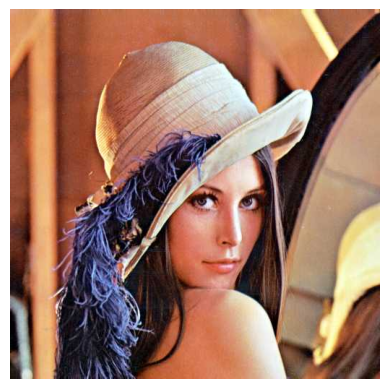

In [ ]:
blue_channel = lena[:, :, 0]
green_channel = lena[:, :, 1]
red_channel = lena[:, :, 2]

lena_rgb = np.stack([red_channel, green_channel, blue_channel], axis=2)

plt.imshow(lena_rgb)
plt.axis("off")

## 1.2 Перестановка

Поменяйте местами левую верхнюю и правую нижнюю четвертинки изображения `lena` и отобразите результат на экран.

In [ ]:
lena_copy = lena_rgb.copy()
lena_for_swap = lena_rgb.copy()

In [ ]:
left_top_quarter = lena_copy[:256, :256 , :]
right_bottom_quarter = lena_copy[256:, 256:, :]

(-0.5, 511.5, 511.5, -0.5)

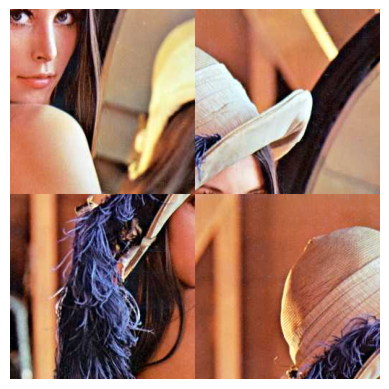

In [ ]:
lena_for_swap[:256, :256 , :] = right_bottom_quarter
lena_for_swap[256:, 256:, :] = left_top_quarter

plt.imshow(lena_for_swap)
plt.axis("off")

## 1.3 Оттенки серого

Усредните значения всех трех цветовых каналов `lena` в каждый из каналов итогового изображения `lena_gray_my`. Переведите исходное цветное изображение `lena` в изображение в градациях серого с помощью функции `cvtColor`. (`lena_gray_cvt`). Вычислите модуль разности между изображениями `lena_gray_my` и `lena_gray_cvt` и отобразите ее на экране.


Если взять просто среднее по всем каналам, то получится искаженное изображение:

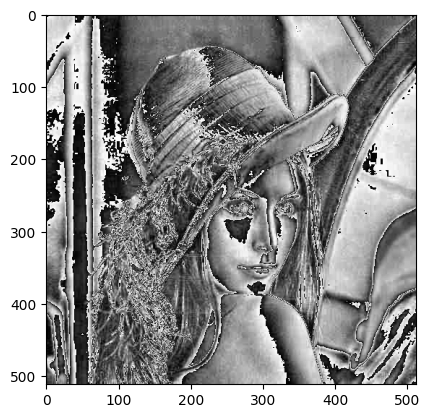

In [ ]:
r, g, b = lena_rgb[:, :, 0], lena_rgb[:, :, 1], lena_rgb[:, :, 2]
lena_gray_my_average = (r + g + b)/3
plt.imshow(lena_gray_my_average, cmap='gray')

Среднее взвешееное по формуле:

$$Grayscale = 0.299 \times R + 0.587 \times G + 0.114 \times B$$

Формула взята из документации: https://docs.opencv.org/2.4/modules/imgproc/doc/miscellaneous_transformations.html#void%20cvtColor%28InputArray%20src,%20OutputArray%20dst,%20int%20code,%20int%20dstCn%29

(-0.5, 511.5, 511.5, -0.5)

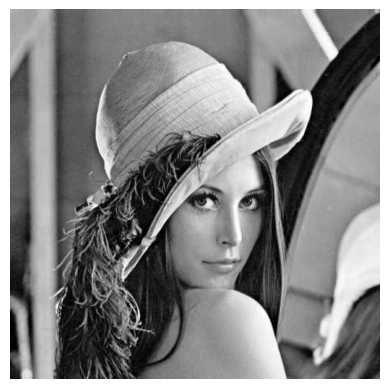

In [ ]:
r, g, b = lena_rgb[:, :, 0], lena_rgb[:, :, 1], lena_rgb[:, :, 2]
lena_gray_my_weighted_average = 0.299 * r + 0.587 * g + 0.114 * b
plt.imshow(lena_gray_my_weighted_average, cmap='gray')
plt.axis("off")

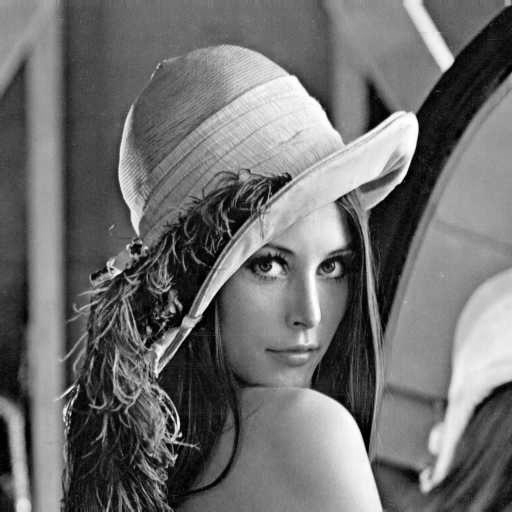

In [ ]:
lena_gray_cvt = cv.cvtColor(lena_rgb, cv.COLOR_BGR2GRAY)
cv2_imshow(lena_gray_cvt)

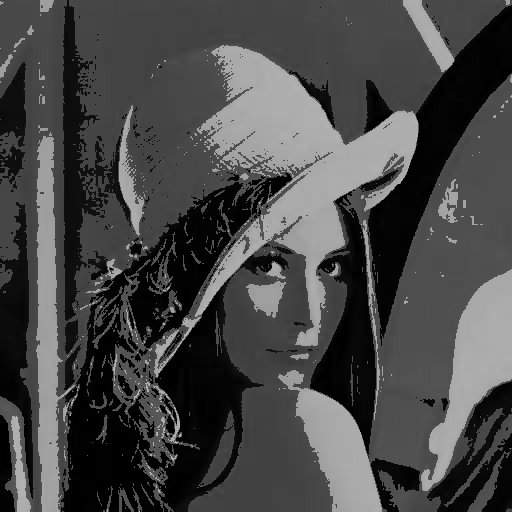

In [ ]:
cv2_imshow(np.abs(lena_gray_my_average - lena_gray_cvt))

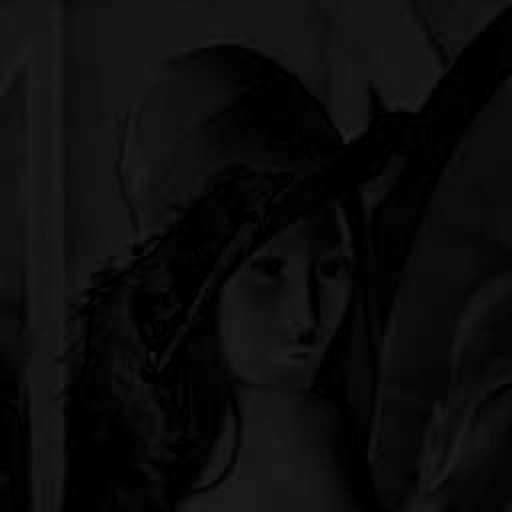

In [ ]:
cv2_imshow(np.abs(lena_gray_my_weighted_average - lena_gray_cvt))

## 1.4 Координата яркости

Переведите изображение `lena` в одно из цветовых пространств (`cvtColor`) с выделенной координатой яркости (`HSV`, `HSL`, `HSB`, `CIE Lab`), инвертируйте яркостную составляющую, переведите обратно в `RGB`. Отобразите результат.

Цветовое пространство HSV (Hue, Saturation, Value)

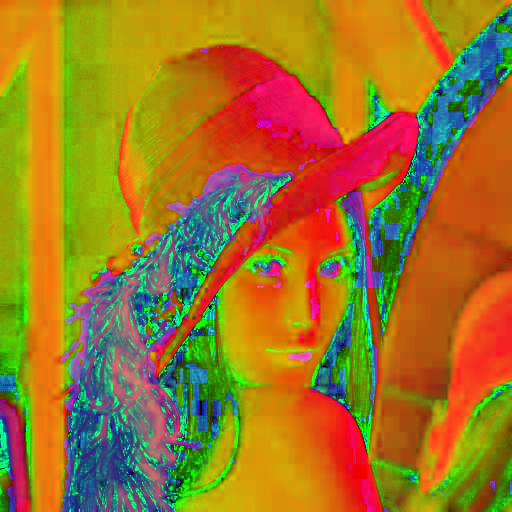

In [ ]:
hsv_lena = cv.cvtColor(lena_rgb, cv.COLOR_RGB2HSV)
cv2_imshow(hsv_lena)

In [ ]:
hsv_lena[:, :, 2] = 255 - hsv_lena[:, :, 2]

In [ ]:
rgb = cv.cvtColor(hsv_lena, cv.COLOR_HSV2RGB)

(-0.5, 511.5, 511.5, -0.5)

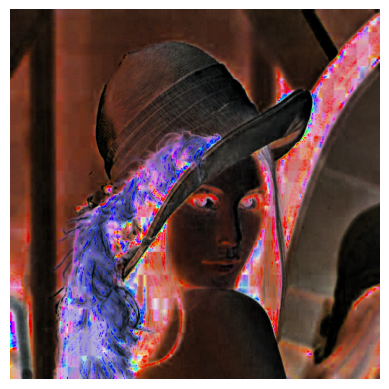

In [ ]:
plt.imshow(rgb)
plt.axis("off")

# Задание 2: Одномерная свертка (2 балла)

Начнем с одномерных сигналов — например, это могут быть различные временные ряды.

## 1.1 Реализация

Реализуйте функцию, вычисляющую одномерную свертку.


In [ ]:
def t_convolve(signal: np.ndarray, kernel: np.ndarray) -> np.ndarray:
    """
    Вычисляет свертку сигнала с ядром без отступов.

    Эта функция реализует дискретную свертку одномерного сигнала с ядром.
    Важно отметить, что ядро переворачивается перед выполнением свертки,
    что соответствует математическому определению свертки. Результатом
    является сигнал меньшего размера, чем входной сигнал, так как отступы
    не используются.

    Args:
        signal (np.ndarray): Входной сигнал.
        kernel (np.ndarray): Ядро свертки.

    Returns:
        np.ndarray: Свернутый сигнал.
                    Размерность выходного сигнала равна len(signal) - len(kernel) + 1.
    """

    signal_len = len(signal)
    kernel_len = len(kernel)

    output_len = signal_len - kernel_len + 1

    output = np.zeros(output_len)

    kernel = kernel[::-1]

    for i in range(output_len):
        output[i] = np.dot(signal[i:i + kernel_len], kernel)

    return output

In [ ]:
signal = np.random.randint(0, 100, size=100)
kernel = np.random.randint(0, 10, size=10)

t_convolve(signal, kernel)

array([1678., 2228., 1416., 1362., 1600., 1700., 1520., 1986., 1964.,
       1975., 2211., 2047., 1841., 2074., 2154., 2101., 2410., 2393.,
       1887., 1773., 1378., 1339., 1562., 1407., 2013., 1769., 1069.,
       1332., 2056., 1820., 1571., 2382., 2425., 1965., 1931., 2030.,
       2656., 2088., 2080., 3135., 2096., 2027., 1905., 1839., 2080.,
       2089., 2896., 2690., 1981., 2071., 1645., 2403., 2526., 2194.,
       2398., 2219., 1622., 1890., 2205., 2170., 2147., 2822., 2503.,
       1980., 2252., 2408., 2497., 2233., 2399., 2614., 2147., 1887.,
       2279., 3075., 2895., 2227., 2507., 2275., 2500., 3023., 2968.,
       2615., 2254., 1993., 2283., 2536., 2479., 2106., 2384., 2021.,
       1932.])

Проверьте правильность реализации, сравнив с реализацией из `scipy.signal.convolve` (используйте `numpy.testing.assert_allclose`)

In [ ]:
import scipy

In [ ]:
scipy_output = scipy.signal.convolve(signal, kernel, mode="valid")
my_output = t_convolve(signal, kernel)

In [ ]:
np.testing.assert_allclose(scipy_output, my_output)

## 1.2 Удаление шума

Посмотрим, как операция свертки может помочь нам убрать шум из сигнала.

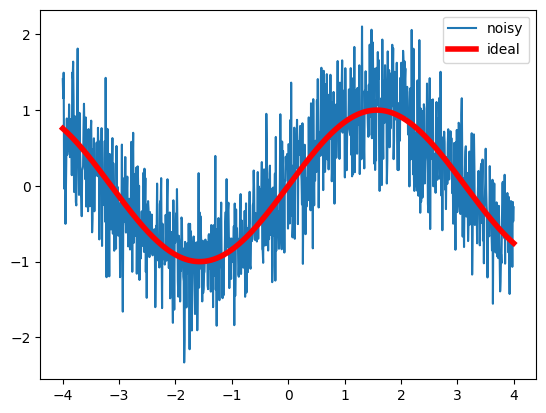

In [ ]:
x = np.linspace(-4, 4, 1000)
signal = np.sin(x)
noisy_signal = signal + np.random.randn(signal.shape[0])*0.5
plt.plot(x, noisy_signal, label='noisy')
plt.plot(x, signal, 'r', label='ideal', linewidth=4)
plt.legend(loc=0)
plt.show()

Для подавления шума можно использовать усреднение значений сигнала в окрестности каждой точки (см. [ЗБЧ](https://ru.wikipedia.org/wiki/%D0%97%D0%B0%D0%BA%D0%BE%D0%BD_%D0%B1%D0%BE%D0%BB%D1%8C%D1%88%D0%B8%D1%85_%D1%87%D0%B8%D1%81%D0%B5%D0%BB)). Вы можете убедиться, что такая операция может быть реализована при помощи свертки данных с ядром, $[\frac 1w, \frac 1w, ..., \frac 1w]$, где $w$ — размер окна.

Вычислите свертку <b>зашумленного</b> сигнала с ядром $[0.2, 0.2, 0.2, 0.2, 0.2]$ </i>

In [ ]:
conv_signal = t_convolve(signal=noisy_signal, kernel=[0.2, 0.2, 0.2, 0.2, 0.2])

Отобразите на одном графике сигнал, зашумленную и восстановленные версии.

In [ ]:
padded_signal = np.pad(conv_signal, (2, 2), mode='constant')

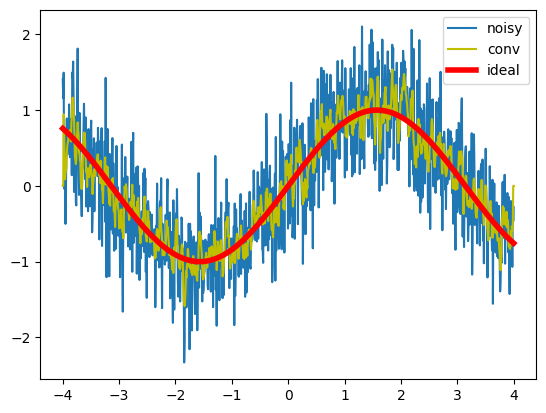

In [ ]:
plt.plot(x, noisy_signal, label='noisy')
plt.plot(x, padded_signal, 'y', label='conv')
plt.plot(x, signal, 'r', label='ideal', linewidth=4)
plt.legend(loc=0)
plt.show()

Попробуйте подобрать такую ширину окна, чтобы востановленный сигнал был наиболее похож на исходный.

In [ ]:
widnow_size = 155
kernel = np.ones(widnow_size) / widnow_size

conv_signal = t_convolve(signal=noisy_signal, kernel=kernel)
padded_signal = np.pad(conv_signal, (len(kernel) // 2, len(kernel) // 2), mode='constant')

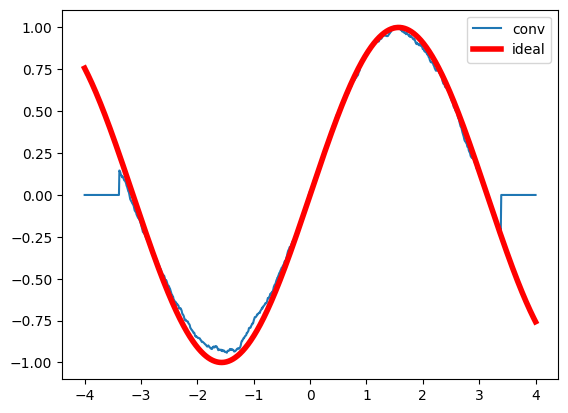

In [ ]:
plt.plot(x, padded_signal, label='conv')
plt.plot(x, signal, 'r', label='ideal', linewidth=4)
plt.legend(loc=0)
plt.show()

# Задание 3: Пулинг (1 балл)

При использовании сверточных слоев принято использовать слои пулинга. Эта операция позволяет уменьшить пространственные размерности изображения и избавиться от избыточности.

## 3.1 Реализация

Реализуйте операции пулинга для цветных изображений.

 ### Сначала предложенная реализация, при которой stride = w (поэтому H и W выходного изображения равны H//w и W//w)

In [ ]:
from typing import Callable

In [ ]:
def pooling(image: np.ndarray, w: int, func: Callable = np.max) -> np.ndarray:
    """
    Применяет операцию пулинга к изображению.

    Args:
        image (np.ndarray): Входное изображение в формате (высота, ширина, каналы).
        w (int): Размер окна пулинга (w x w).
        func (Callable): Функция, используемая для агрегирования значений в окне пулинга.
                         Должна принимать массив и axis=(0, 1) и возвращать одно значение для каждого канала.
                         По умолчанию np.max (максимальный пулинг).

    Returns:
        np.ndarray: Изображение после пулинга с размерами (высота//w, ширина//w, каналы).
    """

    assert(image.ndim == 3)

    H, W, C = image.shape

    H_out = H // w
    W_out = W // w
    C_out = C

    image_out = np.zeros((H_out, W_out, C_out))

    for c in range(C_out):
        for i in range(H_out):
            for j in range(W_out):
                window = image[i*w:(i+1)*w, j*w:(j+1)*w, c]
                max_val = func(window, axis=(0, 1))
                image_out[i, j, c] = max_val

    return image_out

def maxpool(image: np.ndarray, w: int) -> None:
    """
    Применяет операцию максимального пулинга к изображению.

    Args:
        image (np.ndarray): Входное изображение в формате (высота, ширина, каналы).
        w (int): Размер окна пулинга (w x w).
    """
    assert(image.ndim == 3)

    H, W, C = image.shape

    H_out = H // w
    W_out = W // w
    C_out = C

    for c in range(C_out):
        for i in range(H_out):
            for j in range(W_out):
                window = image[i*w:(i+1)*w, j*w:(j+1)*w, c]
                max_val = np.max(window)
                image[i*w:(i+1)*w, j*w:(j+1)*w, c] = max_val

def medianpool(image: np.ndarray, w: int) -> None:
    """
    Применяет операцию медианного пулинга к изображению.

    Args:
        image (np.ndarray): Входное изображение в формате (высота, ширина, каналы).
        w (int): Размер окна пулинга (w x w).
    """
    assert(image.ndim == 3)

    H, W, C = image.shape

    H_out = H // w
    W_out = W // w
    C_out = C

    for c in range(C_out):
        for i in range(H_out):
            for j in range(W_out):
                window = image[i*w:(i+1)*w, j*w:(j+1)*w, c]
                median_val = np.median(window)
                image[i*w:(i+1)*w, j*w:(j+1)*w, c] = median_val

Оригинальное изображение:

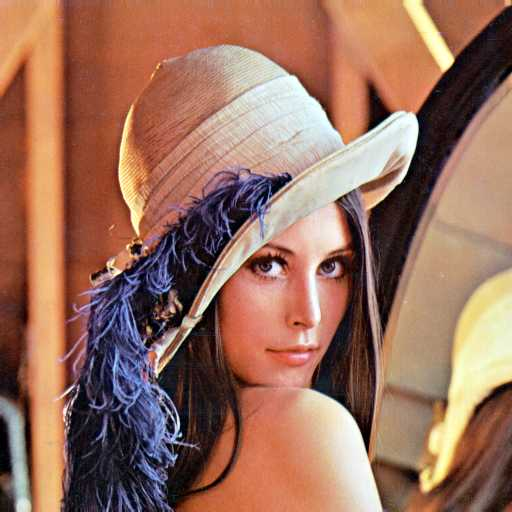

In [ ]:
cv2_imshow(lena)

Изображение после применения maxpool, w=3

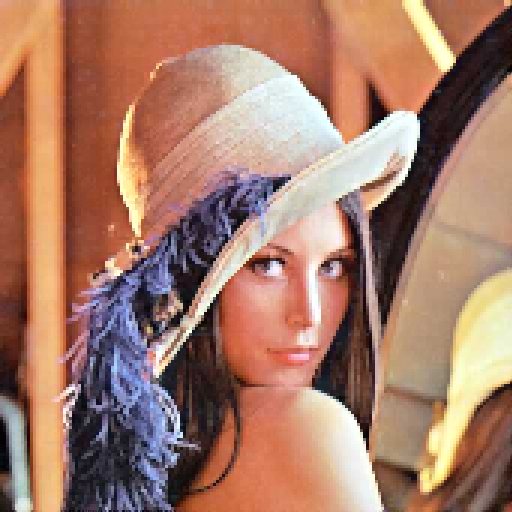

In [ ]:
lena_copy = lena.copy()

maxpool(lena_copy, w=3)
cv2_imshow(lena_copy)

Изображение после применения medianpool, w=3

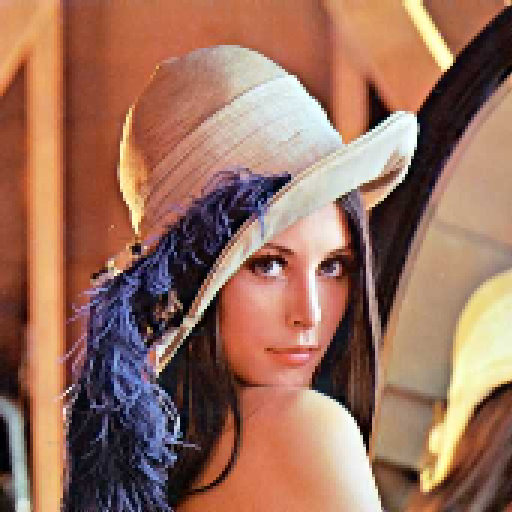

In [ ]:
lena_copy_2 = lena.copy()

medianpool(lena_copy_2, w=3)
cv2_imshow(lena_copy_2)

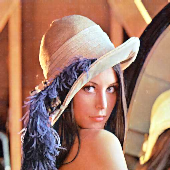

In [ ]:
cv2_imshow(pooling(lena, w=3, func=np.max))

## Релизация cо stride:

## Размеры выходного изображения раны:

$$H' = \left\lfloor \frac{H - w}{S} \right\rfloor + 1$$

$$H' = \left\lfloor \frac{W - w}{S} \right\rfloor + 1$$

$$C' = C$$

## Где:


*   H - высота входного изображения
*   W - ширина входного изображения
*   C - количество каналов входного изображения
*   w - размер окна
*   S - stride

In [ ]:
import math

def pooling_with_stride(image: np.ndarray, w: int, s: int = 1, func: Callable = np.max) -> None:
    assert(image.ndim == 3)

    H, W, C = image.shape

    H_out = math.floor((H - w) / s) + 1
    W_out = math.floor((W - w) / s) + 1
    C_out = C

    image_out = np.zeros((H_out, W_out, C_out))

    for c in range(C_out):
        for i in range(H_out):
            for j in range(W_out):
                window = image[i*s:i*s+w, j*s:j*s+w, c]
                image_out[i, j, c] = func(window, axis=(0, 1))

    return image_out

## В данной реализации изменение не in-place, функция возвращает новый массив. Плюс, размер выходного изображения уменьшается при S > 1, поэтому я буду пользоваться функцией `resize` из библиотеки cv2

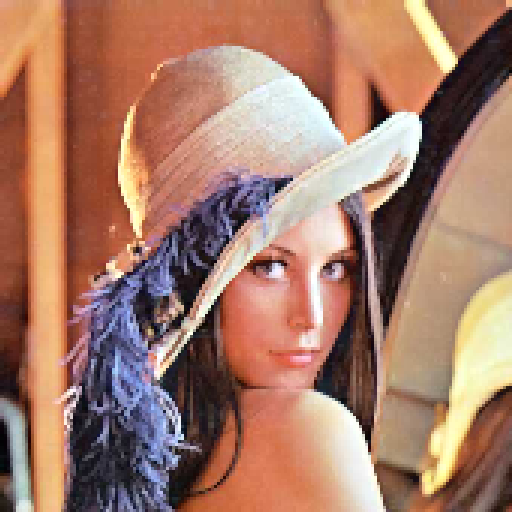

In [ ]:
lena_pooled = pooling_with_stride(lena, w=3, s=3, func=np.max)
resized_lena_pooled = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(resized_lena_pooled)

## В результате получилось тот же результат, что и при применении функции выше, так как w=s=3

## Увеличение параметра s (stride) уменьшает разрешение выходного изображения. (Из-за resize физический размер остается 512х512х3)

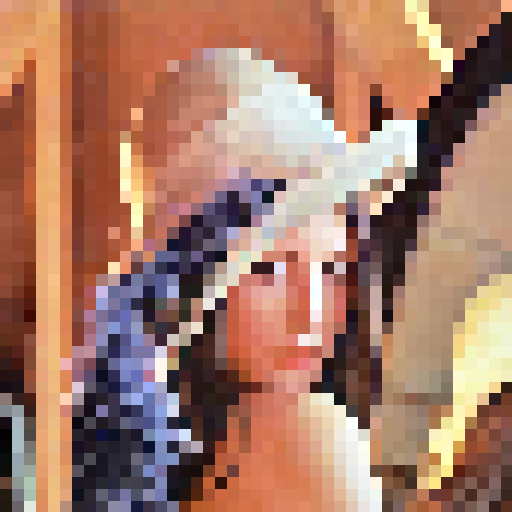

In [ ]:
lena_pooled = pooling_with_stride(lena, w=3, s=12, func=np.max)
resized_lena_pooled = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(resized_lena_pooled)

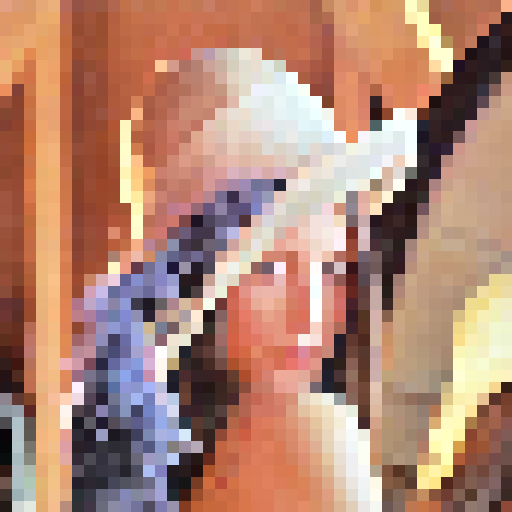

In [ ]:
lena_pooled = pooling_with_stride(lena, w=6, s=12, func=np.max)
resized_lena_pooled = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(resized_lena_pooled)

## 3.2 Применение

Добавить к изображению `lena.png` [шум соль и перец](https://ru.wikipedia.org/wiki/Salt_and_pepper). Примените медианный пулинг и максимальный пулинг.

Сделайте выводы о том, какой тип пулинга лучше справился с поставленной задачей, и почему.

In [ ]:
# Добавление шума к цветному изображению:
def add_salt_and_pepper_noise_color(image, salt_prob, pepper_prob):
    assert(image.ndim == 3)

    noisy_image = np.copy(image)
    total_pixels = image.shape[0] * image.shape[1]

    num_salt = int(total_pixels * salt_prob)
    for c in range(image.shape[2]):
        salt_coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape[:2]]
        noisy_image[salt_coords[0], salt_coords[1], c] = 255

    num_pepper = int(total_pixels * pepper_prob)
    for c in range(image.shape[2]):
        pepper_coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape[:2]]
        noisy_image[pepper_coords[0], pepper_coords[1], c] = 0

    return noisy_image

# Добавление шума к grayscale изображению:
def add_salt_and_pepper_noise_grayscale(image, salt_prob, pepper_prob):
    assert(image.ndim == 3)

    noisy_image = np.copy(image)
    noisy_image = cv.cvtColor(noisy_image, cv.COLOR_BGR2GRAY)
    total_pixels = image.size

    num_salt = int(total_pixels * salt_prob)
    salt_coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape]
    noisy_image[salt_coords[0], salt_coords[1]] = 255

    num_pepper = int(total_pixels * pepper_prob)
    pepper_coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy_image[pepper_coords[0], pepper_coords[1]] = 0

    return noisy_image

## Демонстрация работы алгоритма:

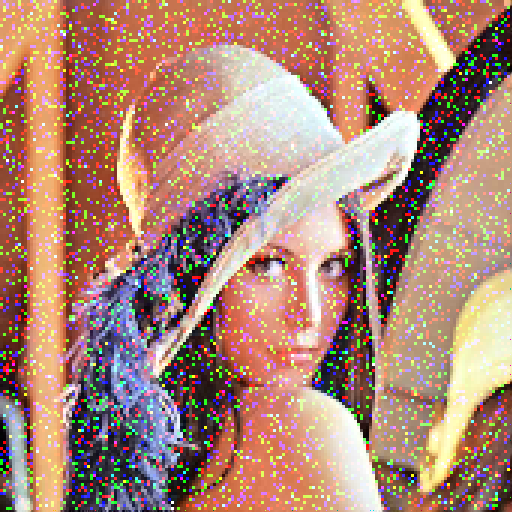

In [ ]:
lena_copy_3 = lena.copy()
lena_salty_color = add_salt_and_pepper_noise_color(lena_copy_3, salt_prob=0.01, pepper_prob=0.01)
maxpool(lena_salty_color, w=3)
cv2_imshow(lena_salty_color)

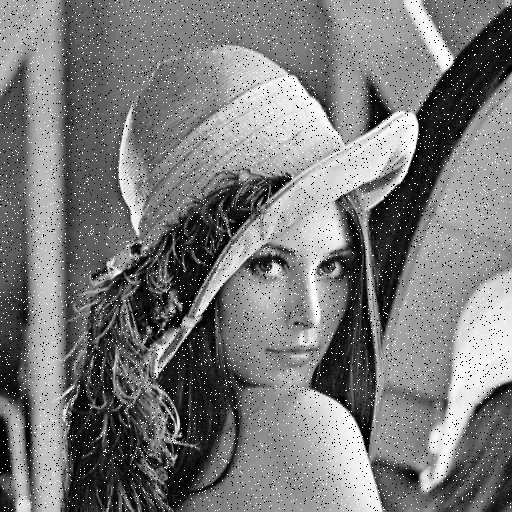

In [ ]:
cv2_imshow(add_salt_and_pepper_noise_grayscale(lena, salt_prob=0.01, pepper_prob=0.01))

## Предположение: добавление шума соли и перца к изображению выкручивает значение случайных пикселей до 255, а некоторых наоборот гасит до 0. Поэтому при применении maxpooling к зашумленному изображению сделает его очень светлым, так как если "соленый" пиксель попадет в рамку, на выходе будет обязательно белый пиксель (или красный/зеленый/синий в завимости от канала, если речь идет про цветное изображение). Чем больше соленых пикселей на изображении, тем светлее будет результат (или при увеличении размера рамки)

## В то же время, применение average pooling к зашумленному изображению почти не даст результата. Если вероятности соли и перца равны, то в рамку попадет равное кол-во соленых и перченых пикселей, и average pooling сгладит последствия зашумления

## А median pooling полностью уберет шум с изображения, так как пиксели с экстремальными значениями (0 и 255) будут проигнорированы


### Оригинал:

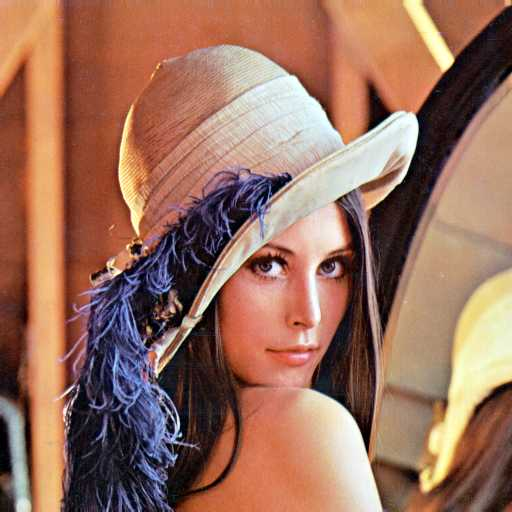

In [ ]:
cv2_imshow(lena)

### Зашумленное изображение:

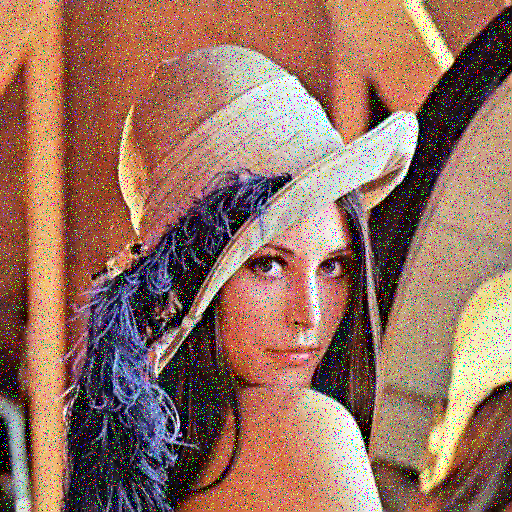

In [ ]:
lena_noized = add_salt_and_pepper_noise_color(lena, salt_prob=0.05, pepper_prob=0.05)
cv2_imshow(lena_noized)

### Применим maxpooling к зашумленному изображению:

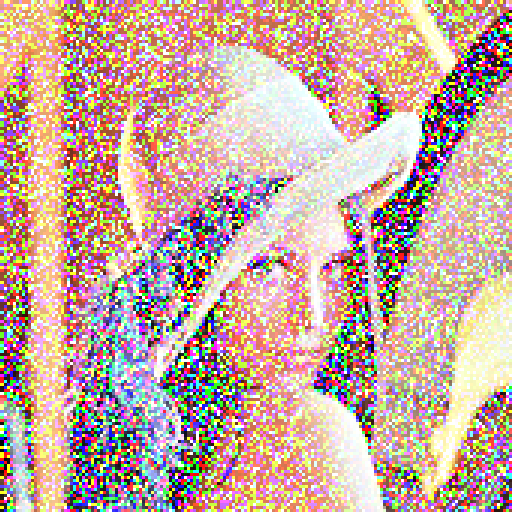

In [ ]:
lena_pooled = pooling_with_stride(lena_noized, w=3, s=3, func=np.max)
lena_resized = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized)

### На изображении получилось много выкрученных до 255 пикселей (в случае цветного изображения для каждого канала)

### Теперь проверим предположение, что average pooling может избавиться от шума

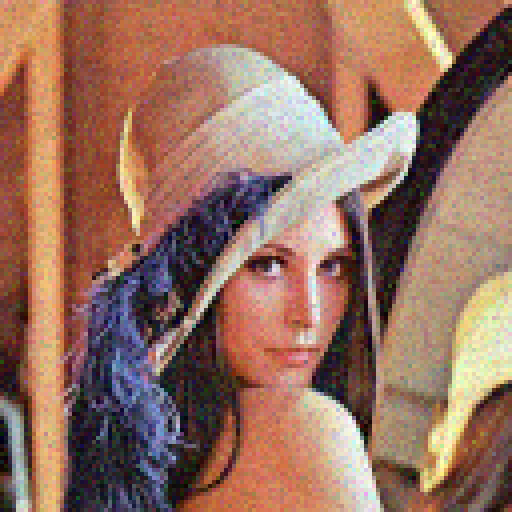

In [ ]:
lena_pooled = pooling_with_stride(lena_noized, w=4, s=4, func=np.average)
lena_resized = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized)

### Конечно, average pooling не избавился от шума полностью, однако он слегка сгладил его

### Попробуем поставить stride = 1, чтобы размер выходного изображения изменился минимально, а размер рамки увеличим. Это должно сделать выходное изобрежение 'мыльным', но в то же время минимизровать шум:

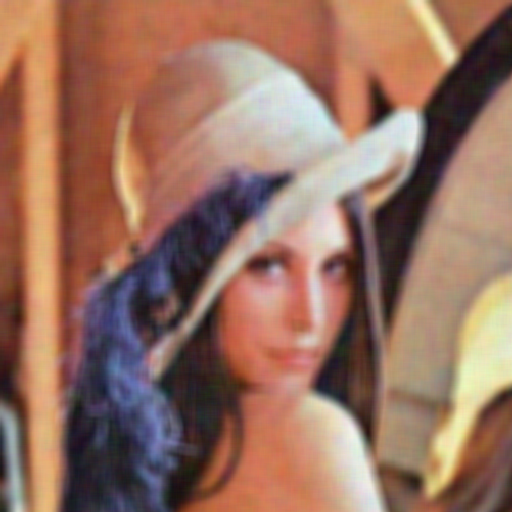

In [ ]:
lena_pooled = pooling_with_stride(lena_noized, w=12, s=1, func=np.average)
lena_resized = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized)

### Для сравнение применим average pooling с теми же параметрами, но к чистому (оригинальному) изображению

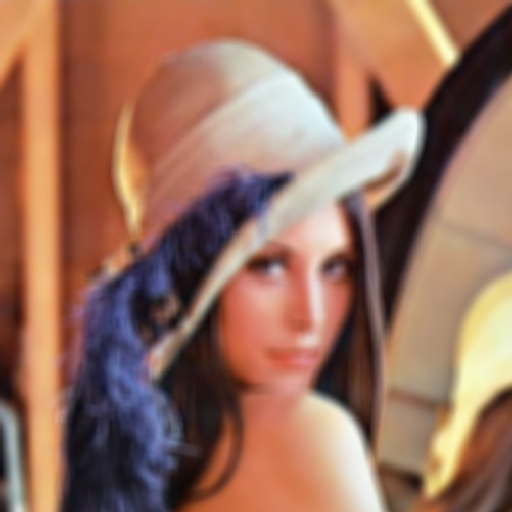

In [ ]:
lena_pooled = pooling_with_stride(lena, w=12, s=1, func=np.average)
lena_resized = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized)

## Average pooling дейтвительно помогает в какой-то степени избавиться от шума

## Вот сравнение применения maxpooling к зашумленному изображению и оригинальному при одинаковых параметрах:

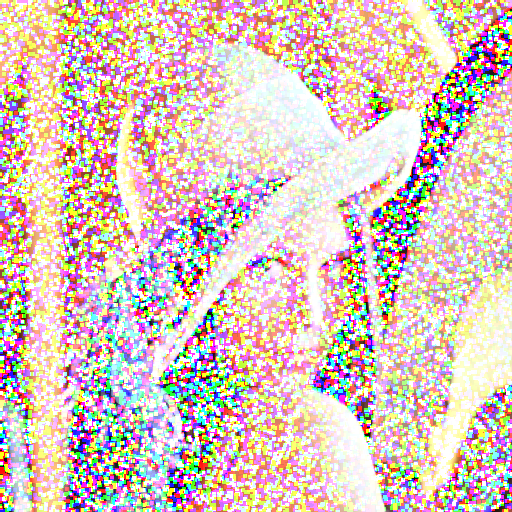

In [ ]:
lena_pooled = pooling_with_stride(lena_noized, w=4, s=1, func=np.max)
lena_resized = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized)

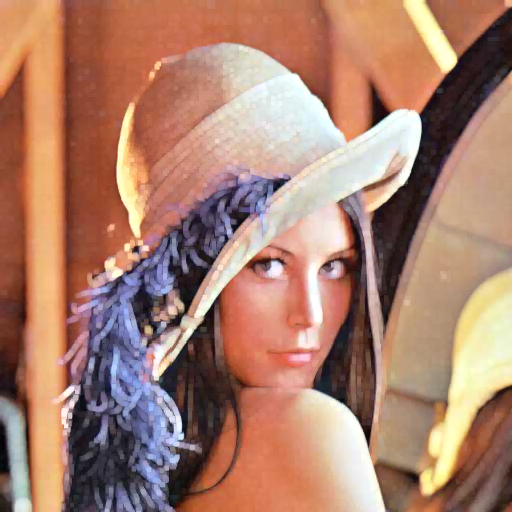

In [ ]:
lena_pooled = pooling_with_stride(lena, w=4, s=1, func=np.max)
lena_resized = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized)

## Далее результат работы median pooling:

### Еще раз посмотрим на зашумленное изображение:

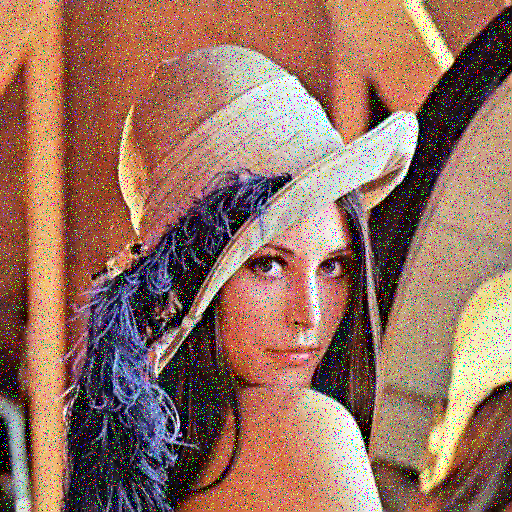

In [ ]:
cv2_imshow(lena_noized)

## Применим к нему median pooling. Постараемся сохранить разрешение оригинального изображения, поэтому выставим stride 1, а размер рамки 2

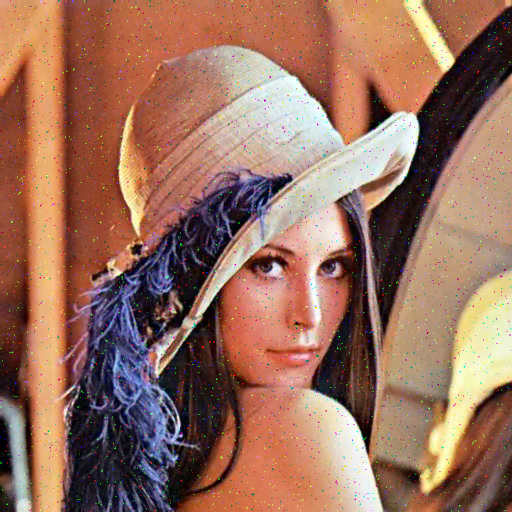

In [ ]:
lena_pooled = pooling_with_stride(lena_noized, w=2, s=1, func=np.median)
lena_resized = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized)

### Невероятно, median pooling почти вернул изображение к исходному состоянию!

### Поставим размер рамки 3, чтобы еще сильнее избавиться от шума:

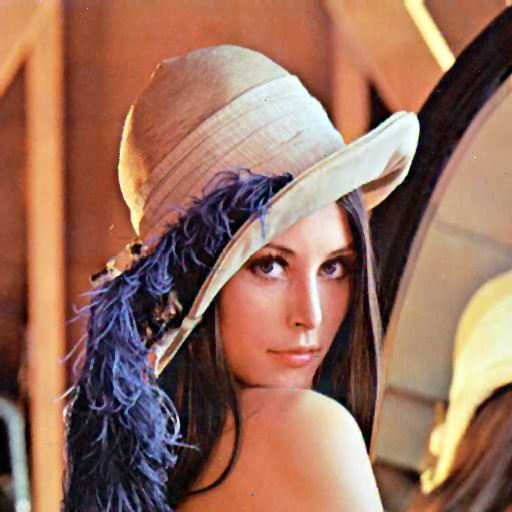

In [ ]:
lena_pooled = pooling_with_stride(lena_noized, w=3, s=1, func=np.median)
lena_resized = cv.resize(lena_pooled, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized)

### Результат: на изображении практически нет шума!

## Теперь посмотрим как пулинги справляются с чб изображениями:

### Для этого получим черно-белую копию зашумленного изображения, и напишем функцию пулинга для изображений с ndim = 2

### Зашумленное черно-белое изображение:

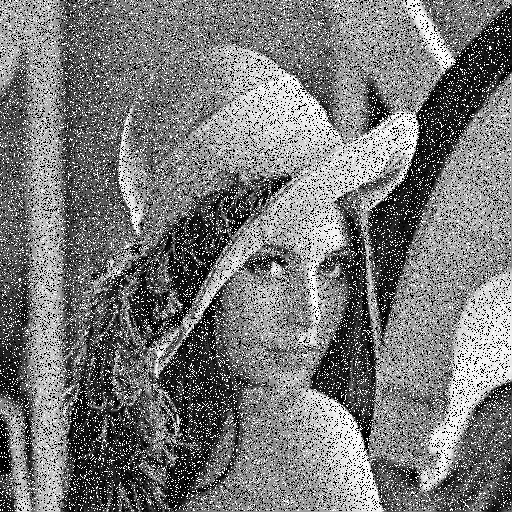

In [ ]:
lena_noized_gray = add_salt_and_pepper_noise_grayscale(lena, salt_prob=0.05, pepper_prob=0.05)
cv2_imshow(lena_noized_gray)

In [ ]:
def pooling_with_stride_gray(image: np.ndarray, w: int, s: int = 1, func: Callable = np.max) -> None:
    assert(image.ndim == 2)

    H, W = image.shape

    H_out = math.floor((H - w) / s) + 1
    W_out = math.floor((W - w) / s) + 1

    image_out = np.zeros((H_out, W_out))

    for i in range(H_out):
        for j in range(W_out):
            window = image[i*s:i*s+w, j*s:j*s+w]
            image_out[i, j] = func(window, axis=(0, 1))

    return image_out

### Применение maxpooling к зашумленному изображению:

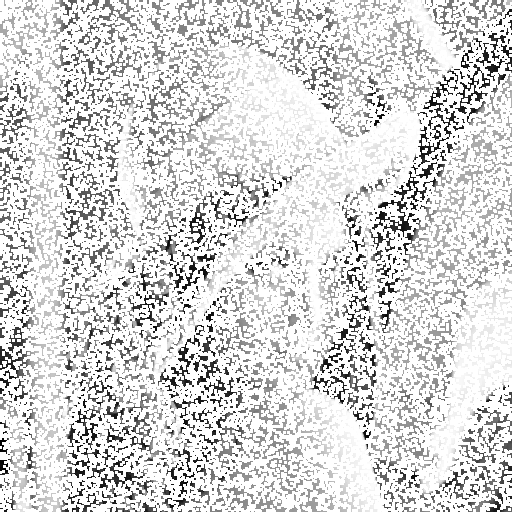

In [ ]:
lena_pooled_gray = pooling_with_stride_gray(lena_noized_gray, w=3, s=1, func=np.max)
lena_resized_gray = cv.resize(lena_pooled_gray, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized_gray)

### Применение average pooling к зашумленному изображению:

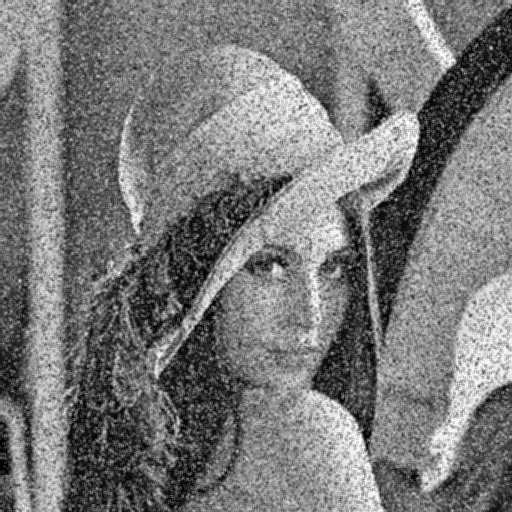

In [ ]:
lena_pooled_gray = pooling_with_stride_gray(lena_noized_gray, w=3, s=1, func=np.average)
lena_resized_gray = cv.resize(lena_pooled_gray, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized_gray)

### Применение median pooling к зашумленному изображению:

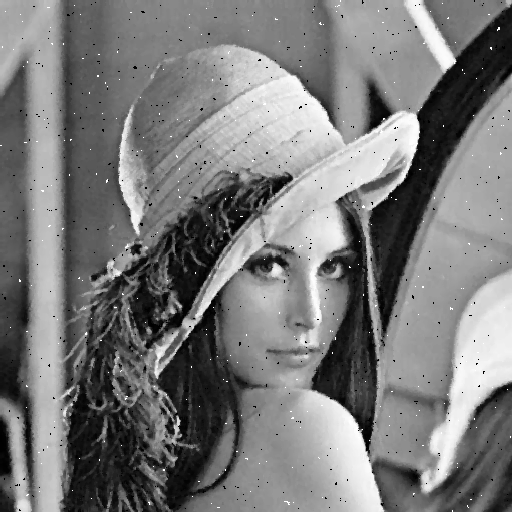

In [ ]:
lena_pooled_gray = pooling_with_stride_gray(lena_noized_gray, w=3, s=1, func=np.median)
lena_resized_gray = cv.resize(lena_pooled_gray, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized_gray)

## Вывод: median pooling лучше всего позволяет избавиться от шума. Медианное значение окна по-сути игнорирует минимальные и максимальные значения пикселей, и берет среднее число из массива. Предположим, что в окне 2 на 2 (массив из 4 пикселей) один пиксель был занижен до нуля, а один выкручен до максимума. Оставльные 2 остались не тронутыми после зашумления. Вот, что получится:

In [ ]:
np.median([0, 32, 34, 255])

33.0

# На изображении выше все равно есть пиксели с экстремальными значениями. Значит, попались такие окна, где все пиксели были либо белыми (255), либо черными (0). Увеличение размера рамки позволит уменьшить количество таких пикселей, но ухудшит качество изображения:

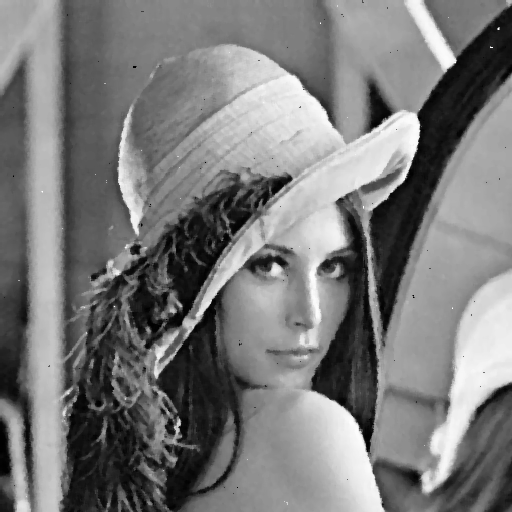

In [ ]:
lena_pooled_gray = pooling_with_stride_gray(lena_noized_gray, w=4, s=1, func=np.median)
lena_resized_gray = cv.resize(lena_pooled_gray, (lena.shape[1], lena.shape[0]), interpolation=cv.INTER_NEAREST)
cv2_imshow(lena_resized_gray)

# Задание 4: Сверточная нейронная сеть (6 баллов)

Реализуйте слои для сверточной нейронной сети и постройте ее на датасете **CIFAR-10** (Canadian Institute For Advanced Research).

*Подробнее про данные можно посмотреть [тут](https://www.cs.toronto.edu/~kriz/cifar.html)*

ВАЖНО! Для получения полного балла достаточно только реализации `forward` методов.

Реализация без PyTorch (наследование от класса `Module` из прошлых дз) обоих слоев даст **дополнительные 5 баллов**.

## 4.1 Сверточный слой (2 балла)

Реализуйте сверточный слой для двумерных данных:

### Библиотека math нужна только для функции floor, с помощью которой я считаю размеры выходного тензора

In [ ]:
import math

### Module из ДЗ 3

In [ ]:
class Module:
    """
    Базовый класс для построения модулей нейронной сети.

    Этот класс предоставляет интерфейс для создания и использования модулей,
    составляющих нейронную сеть.  Он определяет основные методы, которые должны
    быть реализованы в каждом конкретном модуле.

    Attributes:
        mode (str): Режим работы модуля ('train' или 'test').
            Устанавливается с помощью метода set_mode. По умолчанию 'train'.

    Notes:
        Этот класс является абстрактным и не должен использоваться напрямую.
        Он предназначен для создания конкретных модулей нейронной сети, которые
        наследуются от него и реализуют необходимые методы.
    """

    def __init__(self):
        self.mode = 'train'

    def set_mode(self, mode: str) -> None:
        """
        Устанавливает режим работы модуля.

        Args:
            mode (str): Режим работы модуля ('train' или 'test').
        """

        assert mode in ['train', 'test']
        self.mode = mode

    def forward(self, x: np.ndarray) -> np.ndarray:
        """
        Метод для прямого прохода

        Args:
            x (np.ndarray): Входные данные. Размерность может быть (batch_size,
              in_features) или (in_features,) для вектора.

        Returns:
            np.ndarray: Выходные данные после линейного преобразования
            (размерность: (batch_size, out_features) или (out_features,) для вектора).
        """
        pass

    def backward(self, gradient: np.ndarray) -> np.ndarray:
        """
        Метод для обратного прохода

        Args:
            gradient (np.ndarray): Градиент ошибки, полученный от следующего слоя.
            Размерность может быть (batch_size, out_features) или (out_features,)
            для вектора.

        Returns:
            np.ndarray: Градиент ошибки для предыдущего слоя
            (размерность: (batch_size, in_features) или (in_features,) для вектора).
        """
        pass

    def update(self, learning_rate: float) -> None:
        """
        Метод для обновления параметров модуля

        Args:
            learning_rate (float): Скорость обучения.
        """
        pass

### Сверточный слой:

## Градиент сверточного слоя:

## Источник: https://www.pycodemates.com/2023/07/backward-pass-in-convolutional-neural-network-explained.html


In [ ]:
class Conv2d(Module):
    def __init__(
            self,
            in_channels: int,
            out_channels: int,
            kernel_size: int,
            stride: int = 1,
            padding: int = 0
        ) -> None:
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding

        self.weight = np.random.randn(out_channels, in_channels, kernel_size, kernel_size, )
        self.bias = np.zeros(out_channels)

        self.x = None

    def forward(self, x: np.ndarray) -> np.ndarray:
        """
        x: np.ndarray (batch_size, C_in, H_in, W_in)
        output: np.ndarray (batch_size, N_out, H_out, W_out)

        weight: np.ndarray (N, C_in, K, K)
        """
        self.x = x

        batch_size, C_in, H_in, W_in,  = x.shape
        N, _, K, K = self.weight.shape # K - размер ядра

        assert(C_in == self.in_channels), ""
        assert(H_in >= self.kernel_size and W_in >= self.kernel_size), ""

        H_out = math.floor((H_in - K + 2 * self.padding) / self.stride) + 1
        W_out = math.floor((W_in - K + 2 * self.padding) / self.stride) + 1
        N_out = N

        output = np.zeros((batch_size, N_out, H_out, W_out))

        if (self.padding > 0):
            x = np.pad(
                x,
                pad_width=(
                    (0, 0), # batch_size не трогаем
                    (0, 0), # кол-во каналов не трогаем
                    (self.padding, self.padding),
                    (self.padding, self.padding),
                ),
                mode="constant",
                constant_values=0
            )

        for b in range(batch_size):
            for n in range(N_out):
                for h in range(H_out):
                    for w in range(W_out):
                        region = x[
                            b,
                            :,
                            h*self.stride:h*self.stride+K,
                            w*self.stride:w*self.stride+K,
                        ]

                        output[b, n, h, w] = np.sum(region*self.weight[n, :, :, :]) + self.bias[n]

        return output

    def backward(self, gradient):
        batch_size, C_in, H_in, W_in = self.x.shape
        C_out, _, K, K = self.weight.shape
        batch_size, _, H_out, W_out = gradient.shape

        if self.padding > 0:
            self.x = np.pad(
                self.x, pad_width=(
                    (0, 0),
                    (0, 0),
                    (self.padding, self.padding),
                    (self.padding, self.padding)),
                mode='constant',
                constant_values=0
            )

        dx = np.zeros_like(self.x)
        dw = np.zeros_like(self.weight)
        db = np.zeros_like(self.bias)

        for b in range(batch_size):
            for c in range(C_out):
                for h in range(H_out):
                    for w in range(W_out):
                        h_start = h * self.stride
                        h_end = h_start + K
                        w_start = w * self.stride
                        w_end = w_start + K

                        dx[b, :, h_start:h_end, w_start:w_end] += self.weight[c] * gradient[b, c, h, w]

                        dw[c] += self.x[b, :, h_start:h_end, w_start:w_end] * gradient[b, c, h, w]

                        db[c] += gradient[b, c, h, w]

        if self.padding > 0:
            dx = dx[:, :, self.padding:-self.padding, self.padding:-self.padding]

        self.dw = dw
        self.db = db

        return dx

    def update(self, learning_rate: float) -> None:
        self.weight -= learning_rate * self.dw
        self.bias -= learning_rate * self.db

    def set_mode(self, mode: str) -> None:
        pass

## 4.2 Слой макс-пулинга (2 балла)

Реализуйте слой макс-пулинга для двумерных данных:

## Как получить градиент слоя MaxPool:

### Maxpool выбирает максимальные значения в каждом окне во время прямого прохода, значит и при обратном проходе градиент будет распространяться только через позиции максимальных значений входной матрицы. Те значения входной матрицы, которые НЕ максимальные, НЕ влияют на результат функции.

### Источник: https://datascience.stackexchange.com/questions/11699/backprop-through-max-pooling-layers

### В коде: Во время прямого прохода необходимо сохранить индексы максимальных значений в специальную переменную (self.max_indices).

### Затем во время обратного прохода построить нулевую матрицу размера входной матрицы (хранится в переменной self.x в коде), и распространить градиент только через те координаты, которые сохранились в переменной self.max_indices во время прямого прохода

Например, у нас вот такая входная матрица x:

$$
x = \begin{bmatrix}
1 & 2 & 3 & 4 \\
5 & 6 & 7 & 8 \\
9 & 10 & 11 & 12 \\
13 & 14 & 15 & 16
\end{bmatrix}
$$

Тогда на выходе получим следующую матрицу y:

$$
y = \begin{bmatrix}
6 & 8 \\
14 & 16
\end{bmatrix}
$$

Позиции максимальных значений:

$$
6 \ at \ (1, 1) \\
8 \ at \ (1, 3) \\
14 \ at \ (3, 1) \\
16  \ at \  (3, 3) \\
$$

Предположим, из следующего слоя пришел такой градиент:

$$
\frac{\partial L}{\partial y} = \begin{bmatrix}
0.1 & 0.2 \\
0.3 & 0.4
\end{bmatrix}
$$

Инициализируем нулевую матрицу и пропустим значения градиента через координаты максимальных значений:

$$
\frac{\partial L}{\partial x} = \begin{bmatrix}
0 & 0 & 0 & 0 \\
0 & 0.1 & 0 & 0.2 \\
0 & 0 & 0 & 0 \\
0 & 0.3 & 0 & 0.4
\end{bmatrix}
$$

In [ ]:
class MaxPool2d(Module):
    def __init__(self, pool_size: int, stride: int = 1) -> None:
        super().__init__()
        self.pool_size = pool_size
        self.stride = stride if stride is not None else pool_size

        self.x = None
        self.max_indices = None

    def forward(self, x: np.ndarray) -> np.ndarray:
        """
        x: np.ndarray (batch_size, C_in, H_in, W_in)
        output: np.ndarray (batch_size, C_out, H_out, W_out, )
        """
        self.x = x

        batch_size, C_in, H_in, W_in,  = x.shape

        H_out = math.floor((H_in - self.pool_size) / self.stride) + 1
        W_out = math.floor((W_in - self.pool_size) / self.stride) + 1
        C_out = C_in

        output = np.zeros((batch_size, C_out, H_out, W_out))

        self.max_indices = np.zeros((batch_size, C_out, H_out, W_out, 2), dtype=int)

        for b in range(batch_size):
            for c in range(C_out):
                for h in range(H_out):
                    for w in range(W_out):
                        window = x[
                            b,
                            c,
                            h*self.stride:h*self.stride+self.pool_size,
                            w*self.stride:w*self.stride+self.pool_size,
                        ]

                        max_val = np.max(window)
                        max_index = np.unravel_index(np.argmax(window), window.shape)

                        output[b, c, h, w] = max_val
                        self.max_indices[b, c, h, w] = (
                            h*self.stride + max_index[0],
                            w*self.stride + max_index[1]
                        )

        return output

    def backward(self, gradient):
        batch_size, C_out, H_out, W_out = gradient.shape
        dx = np.zeros_like(self.x)

        for b in range(batch_size):
            for c in range(C_out):
                for h in range(H_out):
                    for w in range(W_out):
                        h_max, w_max = self.max_indices[b, c, h, w]
                        dx[b, c, h_max, w_max] += gradient[b, c, h, w]

        return dx

    def update(self, learning_rate: float) -> None:
        pass

    def set_mode(self, mode: str) -> None:
        pass

### Линейный слой из ДЗ 3

In [ ]:
class Linear(Module):
    """
    Реализует полносвязный линейный слой.

    Этот слой выполняет линейное преобразование входных данных: y = xW + b,
    где W - матрица весов, b - вектор смещения, а x - входные данные.

    Args:
        in_features (int): Количество входных признаков.
        out_features (int): Количество выходных признаков.

    Attributes:
        bias (np.ndarray): Параметр сдвига (размер `out_features`).
        weight (np.ndarray): Параметры слоя (размер (`in_features`, `out_features`)).

    """

    def __init__(self, in_features, out_features):
        super().__init__()
        self.weights = np.random.normal(0, np.sqrt(2.0 / in_features), size=(in_features, out_features))
        self.bias = np.zeros(out_features)

        self.dweights = None
        self.dbias = None

        self.input = None

    def forward(self, x):
        self.input = x
        return np.dot(x, self.weights) + self.bias

    def backward(self, gradient):
        dx = np.dot(gradient, self.weights.T)
        self.dweights = np.dot(self.input.T, gradient)
        self.dbias = np.sum(gradient, axis=0)
        return dx

    def update(self, learning_rate: float) -> None:
        self.weights -= learning_rate * self.dweights
        self.bias -= learning_rate * self.dbias

    def set_mode(self, mode: str) -> None:
        pass

### ReLU из ДЗ 3

In [ ]:
class ReLU(Module):
    def __init__(self) -> None:
        super().__init__()
        self.x = None

    def forward(self, x: np.ndarray) -> np.ndarray:
        self.x = x
        return np.maximum(0, x)

    def backward(self, gradient):
        drelu = np.where(self.x > 0, 1, 0)
        return gradient * drelu

    def update(self, learning_rate: float) -> None:
        pass

    def set_mode(self, mode: str) -> None:
        pass

### Класс Flatten, необходим между сверточными слоями и линейными

In [ ]:
class Flatten(Module):
    def __init__(self) -> None:
        super().__init__()
        self.input_shape = None

    def forward(self, x: np.ndarray) -> np.ndarray:
        batch_size, C_in, H_in, W_in = x.shape
        self.input_shape = x.shape
        x = x.reshape(batch_size, -1)

        return x

    def backward(self, gradient):
        return gradient.reshape(self.input_shape)

    def update(self, learning_rate):
        pass

    def set_mode(self, mode: str) -> None:
        pass

### SoftMax из ДЗ 3

In [ ]:
class Softmax(Module):
    def __init__(self):
        self.output = None

    def forward(self, x):
        exp_x = np.exp(x - np.max(x, axis=1, keepdims=True))
        self.output = exp_x / np.sum(exp_x, axis=1, keepdims=True)
        return self.output

    def backward(self, gradient):
        return gradient

    def update(self, learning_rate):
        pass

    def set_mode(self, mode: str) -> None:
        pass

### Dropout из ДЗ 3

In [ ]:
class Dropout(Module):
    """
    Реализует слой Dropout для регуляризации нейронной сети.

    Dropout случайным образом обнуляет нейроны входного слоя во время обучения,
    чтобы предотвратить переобучение.  Во время тестирования, слой Dropout
    не влияет на входные данные, просто пропуская их без изменений.

    Args:
        p (float): Вероятность того, что нейрон будет обнулен.
                   Значение должно быть между 0 и 1. По умолчанию 0.1.
    """

    def __init__(self, p: float = 0.1):
        super().__init__()
        self.p = p
        self.mask = None
        self.mode = None

    def forward(self, x: np.ndarray) -> np.ndarray:
      if self.mode == 'train':
          self.mask = (np.random.rand(*x.shape) > self.p).astype(float)
          self.mask /= (1 - self.p)
          return x * self.mask
      elif self.mode == 'test':
          return x
      else:
          raise ValueError(f'Invalid mode: {self.mode}')

    def backward(self, gradient: np.ndarray) -> np.ndarray:
        if self.mode == "train":
            return gradient * self.mask
        elif self.mode == "test":
            return gradient
        else:
            raise ValueError(f"Invalid mode: {self.mode}.")

    def update(self, learning_rate: float) -> None:
        pass

    def set_mode(self, mode: str) -> None:
        self.mode = mode

### CrossEntropy из ДЗ 3

In [ ]:
class CrossEntropy:
    def __init__(self):
        self.true_labels = None
        self.pred_probs = None

    def forward(self, pred_probs, true_labels):
        self.true_labels = true_labels
        self.pred_probs = pred_probs
        pred_probs = np.clip(pred_probs, 1e-15, 1 - 1e-15)
        loss = -np.sum(true_labels * np.log(pred_probs)) / pred_probs.shape[0]
        return loss

    def backward(self):
        grad_output = (self.pred_probs - self.true_labels) / self.pred_probs.shape[0]
        return grad_output

## Построение нейронной сети (2 балла)

Постройте сверточную нейронную сеть на датасете **CIFAR-10**.

ВАЖНО! Для построения CNN можно использовать только кастомные слои, написанные в этом и предыдущих дз.

In [ ]:
BATCH_SIZE = 8

transform = transforms.Compose(
    [transforms.Grayscale(num_output_channels=1),
     transforms.ToTensor()])

trainset = CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

testset = CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = DataLoader(testset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

Files already downloaded and verified
Files already downloaded and verified


In [ ]:
class Net:
    """
    Реализация нейронной сети с использованием модульной структуры.

    Attributes:
        modules (list[Module]): Список модулей, составляющих сеть.
        learning_rate (float):  Скорость обучения, используемая при обновлении параметров модулей.
        max_iter (int): Максимальное количество эпох обучения.
    """

    def __init__(
            self,
            modules: list[Module],
            learning_rate: float = 0.001,
            max_iter: int = 10
            ):

        self.modules = modules
        self.learning_rate = learning_rate
        self.max_iter = max_iter

    def __set_mode(self, mode: str):
        """
        Устанавливает режим работы для каждого модуля в сети.

        Args:
            mode (str): Режим работы для каждого модуля ('train' или 'test').
        """

        for i in range(len(self.modules)):
            self.modules[i].set_mode(mode)

    def train(self, trainloader: DataLoader) -> None:
        """
        Обучает модель на заданных данных.

        Args:
            trainloader (DataLoader): Загрузчик данных,
            предоставляющий батчи обучающих данных.
        """
        self.__set_mode('train')

        cross_entropy = CrossEntropy()

        for epoch in range(self.max_iter):
            for data in trainloader:
                inputs, labels = data

                X_batch = inputs.numpy()
                y_batch = labels.numpy().reshape(labels.shape[0],)
                y_batch = self.one_hot_encode(y_batch.astype(int))

                y_pred = self.forward(X_batch)
                loss = cross_entropy.forward(y_pred, y_batch)
                grad_output = cross_entropy.backward()
                self.backward(grad_output)
                self.update()

            y_pred = self.forward(X_batch)
            loss = cross_entropy.forward(y_pred, y_batch)

            print(f"Epoch [{epoch + 1}/{self.max_iter}], Train data Loss: {loss:.4f}")


    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Делает предсказание на заданных входных данных.

        Args:
            X (np.ndarray): Матрица входных данных.

        Returns:
            np.ndarray: Матрица предсказанных значений.
        """

        self.__set_mode('test')

        y_pred = self.forward(X)
        return y_pred

    def forward(self, x):
        for module in self.modules:
            x = module.forward(x)
        return x

    def backward(self, grad_output):
        for module in reversed(self.modules):
            grad_output = module.backward(grad_output)

    def update(self):
        for module in self.modules:
            module.update(self.learning_rate)

    def one_hot_encode(self, y: np.ndarray) -> np.ndarray:
        num_classes = 10
        y_one_hot = np.zeros((y.shape[0], num_classes))
        y_one_hot[np.arange(y.shape[0]), y] = 1
        return y_one_hot

In [ ]:
cnn_2 = Net(
    modules=[
        Conv2d(in_channels=1, out_channels=2, kernel_size=3, stride=1, padding=0),
        ReLU(),
        MaxPool2d(pool_size=2, stride=2),

        Flatten(),

        Linear(450, 16),
        ReLU(),
        Dropout(p=0.1),

        Linear(16, 10),
        ReLU(),
        Softmax()
    ],
    learning_rate = 0.01,
    max_iter = 10
)

In [ ]:
cnn_2.train(trainloader)

Epoch [1/10], Train data Loss: 2.1772
Epoch [2/10], Train data Loss: 2.1980
Epoch [3/10], Train data Loss: 2.3465


KeyboardInterrupt: 

## Синтетический пример на CNN для демонстрации работы сети:

In [ ]:
modules=[
    Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1),
    ReLU(),
    MaxPool2d(pool_size=2, stride=2),

    Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),
    ReLU(),
    MaxPool2d(pool_size=2, stride=2),

    Flatten(),

    Linear(4096, 512),
    ReLU(),
    Dropout(),

    Linear(512, 10),
    ReLU(),
    Softmax()
]

## Forward pass:

In [ ]:
X_train_batch = np.random.randn(64, 3, 32, 32)
y_train_batch = np.random.randn(64, 10)

for module in modules:
    module.set_mode('train')

x = X_train_batch
for module in modules:
    x = module.forward(x)

y_pred = x

cross_entropy_loss = CrossEntropy()
loss = cross_entropy_loss.forward(y_pred, y_train_batch)

## Градиент слоя ошибки:

In [ ]:
grad_output = cross_entropy_loss.backward()

## Backward pass:

In [ ]:
for module in reversed(modules):
    grad_output = module.backward(grad_output)

## Обновление весов:


In [ ]:
for module in modules:
    module.update(learning_rate=0.01)

## Предсказание:

In [ ]:
x = X_train_batch
for module in modules:
    x = module.forward(x)

In [ ]:
def calculate_accuracy(model: Net, dataloader: DataLoader) -> float:
  """
  Вычисляет точность модели на заданном даталоадере.

  Args:
    model (Net): Модель для тестирования.
    dataloader (DataLoader): Загрузчик данных, предоставляющий батчи тестовых данных.

  Returns:
    float: Accuarcy.
  """
  correct = 0
  total = 0

  for data in dataloader:
    inputs, labels = data
    inputs = inputs.numpy()
    inputs = inputs.reshape(inputs.shape[0], -1)

    outputs = model.predict(inputs)
    predicted = np.argmax(outputs, axis=1)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()

  return correct / total

Сравните построенную сверточную нейронную сеть с полносвязной нейронной сетью из предыдущего домашнего задания.

# Домашнее задание № 4

Выполните задания в этом ноутбуке и напишите полученные выводы.

+ Мягкий дедлайн: `19.02.25 23:59`
+ Жесткий дедлайн: `26.02.25 23:59` (половина баллов)


После жесткого дедлайна задание не принимается.